In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as T
import torchvision.transforms.functional as TF
from torch.utils.data import DataLoader
from torch.utils.data import Dataset, random_split, Subset
from PIL import Image
from torchvision import datasets, models, transforms
from diffusers import DDPMPipeline, DDIMScheduler
import matplotlib.pyplot as plt
import time, copy
from collections import Counter

from tqdm.auto import tqdm
import os
import numpy as np
import pandas as pd

from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

In [2]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("mstjebashazida/affectnet")

print("Path to dataset files:", path)

Using Colab cache for faster access to the 'affectnet' dataset.
Path to dataset files: /kaggle/input/affectnet


In [3]:
# Loading the Dataset - Train Test Validation
data_dir = os.path.join(path, 'archive (3)')

train_dir = os.path.join(data_dir, 'Train')
test_dir = os.path.join(data_dir, 'Test')

# Let's transform the images to tensors and normalize them

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

In [4]:
class AffectNetDataset(Dataset):
    def __init__(self, root_dir, class_names, transform=None):
        self.root_dir = root_dir
        self.class_names = class_names
        self.transform = transform
        self.images = []
        self.labels = []

        # Iterate through each class directory
        for label, class_name in class_names.items():
            class_dir = os.path.join(root_dir, class_name)

            # Check if the class directory exists
            if os.path.isdir(class_dir):
                # Get all image files in the class directory (including .png and .jpg)
                image_files = [f for f in os.listdir(class_dir) if f.lower().endswith(('.png', '.jpg'))] # Modified to include .jpg

                if not image_files:
                    print(f"Warning: No .png or .jpg images found in {class_dir}") # Updated warning

                for img_file in image_files:
                    # The label is the class_name based on the directory structure
                    self.images.append(os.path.join(class_dir, img_file))
                    self.labels.append(label) # Use the label from the loop
            else:
                print(f"Warning: Class directory not found: {class_dir}") # Added warning for missing directories


    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = self.images[idx]
        image = Image.open(img_path).convert('RGB')
        label = self.labels[idx]

        if self.transform:
            image = self.transform(image)

        return image, label

In [5]:
# Loading the Dataset - Train Test Validation
data_dir = os.path.join(path, 'archive (3)')

train_dir = os.path.join(data_dir, 'Train')
test_dir = os.path.join(data_dir, 'Test')

# Create a combined dataset of original images from train and test directories
all_original_images = []
all_original_labels = []

# Use the consistent lowercase class names for both train and test sets
class_names_dict = {0: 'anger', 1: 'contempt', 2: 'disgust', 3: 'fear', 4: 'happy', 5: 'neutral', 6: 'sad', 7: 'surprise'}

# Process training directory
train_dataset_unbalanced = AffectNetDataset(root_dir=train_dir, class_names={0: 'anger', 1: 'contempt', 2: 'disgust', 3: 'fear', 4: 'happy', 5: 'neutral', 6: 'sad', 7: 'surprise'}, transform=transform)

# Process test directory - assuming consistent class names (lowercase)
# Note: If the test directory has different class names, you might need to adjust this
test_dataset_unbalanced_unsplit = AffectNetDataset(root_dir=test_dir, class_names={0: 'Anger', 1: 'Contempt', 2: 'disgust', 3: 'fear', 4: 'happy', 5: 'neutral', 6: 'sad', 7: 'surprise'}, transform=transform)

In [7]:
# Create a combined dataset class (simple wrapper)
# class CombinedOriginalDataset(Dataset):
#     def __init__(self, images, labels, transform=None):
#         self.images = images
#         self.labels = labels
#         self.transform = transform

#     def __len__(self):
#         return len(self.images)

#     def __getitem__(self, idx):
#         img_path = self.images[idx]
#         image = Image.open(img_path).convert('RGB')
#         label = self.labels[idx]

#         if self.transform:
#             image = self.transform(image)

#         return image, label

# combined_original_dataset = CombinedOriginalDataset(all_original_images, all_original_labels, transform=transform)


# Define the split ratio (80% train, 10% validation, 10% test)
total_size = len(test_dataset_unbalanced_unsplit)
val_size = int(0.5 * total_size)
test_size = total_size - val_size # Ensure all samples are included

# Split the dataset
val_dataset_unbalanced, test_dataset_unbalanced = random_split(test_dataset_unbalanced_unsplit, [val_size, test_size])


Unbalanced dataset split:
Training set size: 16108
Validation set size: 7259
Test set size: 7259

Training Set distribution:
anger: 1500 images (9.3%)
contempt: 1559 images (9.7%)
disgust: 1229 images (7.6%)
fear: 1512 images (9.4%)
happy: 2340 images (14.5%)
neutral: 2758 images (17.1%)
sad: 3091 images (19.2%)
surprise: 2119 images (13.2%)

Validation Set distribution:
anger: 868 images (12.0%)
contempt: 668 images (9.2%)
disgust: 598 images (8.2%)
fear: 817 images (11.3%)
happy: 1332 images (18.3%)
neutral: 1218 images (16.8%)
sad: 788 images (10.9%)
surprise: 970 images (13.4%)

Test Set distribution:
anger: 850 images (11.7%)
contempt: 644 images (8.9%)
disgust: 650 images (9.0%)
fear: 847 images (11.7%)
happy: 1372 images (18.9%)
neutral: 1150 images (15.8%)
sad: 796 images (11.0%)
surprise: 950 images (13.1%)


/tmp/ipython-input-4277779289.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(classes, rotation=45, ha='right')
/tmp/ipython-input-4277779289.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(classes, rotation=45, ha='right')
/tmp/ipython-input-4277779289.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(classes, rotation=45, ha='right')


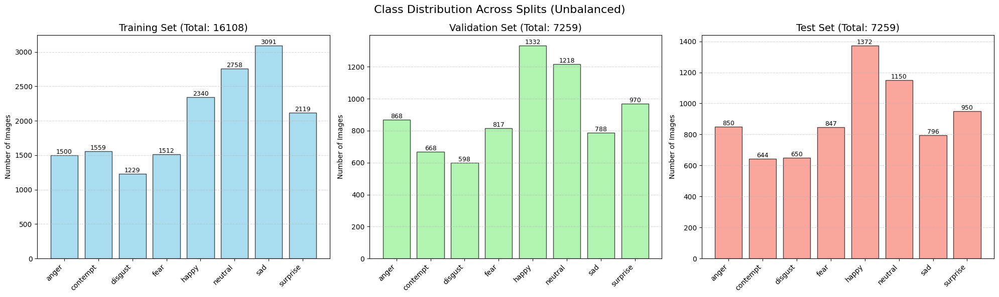

In [8]:
# 1. ASSIGN UNBALANCED DATASETS DIRECTLY (Skipping the balancing function)
# We bypass the undersampling logic entirely as requested.
train_dataset = train_dataset_unbalanced
val_dataset = val_dataset_unbalanced
test_dataset = test_dataset_unbalanced

# Create data loaders
batch_size = 16
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Verify distribution of the unbalanced sets
print("Unbalanced dataset split:")
print(f"Training set size: {len(train_dataset)}")
print(f"Validation set size: {len(val_dataset)}")
print(f"Test set size: {len(test_dataset)}")

# Define class_names for later use
class_names = class_names_dict

# 2. MODIFIED PRINT FUNCTION
# This now returns the counts dictionary so we can use it for plotting
def get_and_print_distribution(dataset, class_names, split_name):
    labels = []

    # Efficiently retrieve labels from Subset or Dataset
    if isinstance(dataset, Subset):
        labels = [dataset.dataset.labels[idx] for idx in dataset.indices]
    else:
        labels = dataset.labels

    if not labels:
        print(f"Could not determine class distribution for {split_name}.")
        return {}

    label_counts = Counter(labels)
    total_samples = len(labels)

    print(f"\n{split_name} distribution:")
    for i in range(len(class_names)):
        count = label_counts.get(i, 0)
        percentage = (count / total_samples * 100) if total_samples > 0 else 0
        print(f"{class_names[i]}: {count} images ({percentage:.1f}%)")

    return label_counts

# 3. PLOTTING FUNCTION
def plot_class_distributions(train_counts, val_counts, test_counts, class_names):
    # Prepare data for plotting
    classes = [class_names[i] for i in range(len(class_names))]

    # Extract counts in the correct order (0 to 7)
    train_values = [train_counts.get(i, 0) for i in range(len(class_names))]
    val_values = [val_counts.get(i, 0) for i in range(len(class_names))]
    test_values = [test_counts.get(i, 0) for i in range(len(class_names))]

    # Setup plot
    fig, axes = plt.subplots(1, 3, figsize=(20, 6), sharey=False)
    fig.suptitle('Class Distribution Across Splits (Unbalanced)', fontsize=16)

    # Helper to plot individual bar chart
    def plot_bar(ax, values, title, color):
        bars = ax.bar(classes, values, color=color, alpha=0.7, edgecolor='black')
        ax.set_title(title, fontsize=14)
        ax.set_xticklabels(classes, rotation=45, ha='right')
        ax.set_ylabel('Number of Images')
        ax.grid(axis='y', linestyle='--', alpha=0.5)

        # Add text annotations on top of bars
        for bar in bars:
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2., height,
                    f'{int(height)}',
                    ha='center', va='bottom', fontsize=9)

    # Plot Train
    plot_bar(axes[0], train_values, f'Training Set (Total: {sum(train_values)})', 'skyblue')

    # Plot Validation
    plot_bar(axes[1], val_values, f'Validation Set (Total: {sum(val_values)})', 'lightgreen')

    # Plot Test
    plot_bar(axes[2], test_values, f'Test Set (Total: {sum(test_values)})', 'salmon')

    plt.tight_layout()
    plt.subplots_adjust(top=0.88) # Adjust for suptitle
    plt.show()

# 4. EXECUTION
# Get counts and print text stats
train_counts = get_and_print_distribution(train_dataset, class_names, "Training Set")
val_counts = get_and_print_distribution(val_dataset, class_names, "Validation Set")
test_counts = get_and_print_distribution(test_dataset, class_names, "Test Set")

# Generate the plots
plot_class_distributions(train_counts, val_counts, test_counts, class_names)

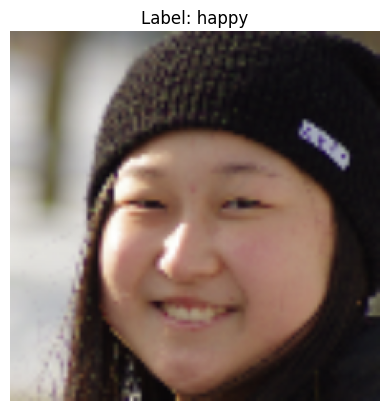

Label: 4


In [ ]:
# Get a random index
random_index = torch.randint(len(train_dataset), size=(1,)).item()

# Get an image and label from the training dataset
image, label = train_dataset[random_index]

# Denormalize the image for display
mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
image = image * std + mean

# Convert the image tensor to a format suitable for matplotlib
plt_image = image.permute(1, 2, 0).numpy()

# Display the image
plt.imshow(plt_image)
plt.title(f"Label: {class_names[label]}")
plt.axis('off')
plt.show()

# Print the label
print(f"Label: {label}")

In [12]:
# Option 1: Use ResNet50 pretrained on ImageNet (current approach)
# model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V1)

# Option 2: Try a different ResNet architecture (e.g., ResNet18 or ResNet101)
# You might need to adjust fine-tuning strategy based on the architecture
# For ResNet18:
# model = models.resnet18(weights=models.ResNet18_Weights.DEFAULT)
# For ResNet101:
model = models.resnet101(weights=models.ResNet101_Weights.DEFAULT)

# Using ResNet50 with default weights for now, as it's a good balance
# model = models.resnet50(weights=models.ResNet50_Weights.DEFAULT)


# Freeze all layers except the final fully connected layer
# for param in list(model.parameters())[:-2]: # This freezes conv layers and avgpool
#     param.requires_grad = False

# Fine-tune the entire model (or more layers than just the final one)
# Unfreeze all layers for fine-tuning
for param in model.parameters():
    param.requires_grad = True


num_ftrs = model.fc.in_features
model.fc = nn.Sequential(
    nn.Linear(num_ftrs, 512),
    nn.ReLU(),
    nn.Dropout(0.3),
    nn.Linear(512, 8) # Assuming 8 classes
)

Downloading: "https://download.pytorch.org/models/resnet101-cd907fc2.pth" to /root/.cache/torch/hub/checkpoints/resnet101-cd907fc2.pth


100%|██████████| 171M/171M [00:00<00:00, 191MB/s]


In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model = model.to(device)

optimizer = optim.AdamW(model.parameters(), lr=0.001,weight_decay=1e-3)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=10)

best_model_wts = copy.deepcopy(model.state_dict())
best_acc = 0.0

history = {
    'train_loss': [],
    'train_acc': [],
    'val_loss': [],
    'val_acc': []
}

print(f"Training dataset size: {len(train_dataset)}")
print(f"Number of batches in train loader: {len(train_loader)}")
print(f"Validation dataset size: {len(val_dataset)}")
print(f"Number of batches in val loader: {len(val_loader)}")
print(f"Using device: {device}")
print(f"GPU Memory allocated: {torch.cuda.memory_allocated(device)/1e9:.2f} GB")


for epoch in range(5):
    print(f'Epoch {epoch+1}/1')
    print('-' * 10)

    for phase in ['train', 'val']:
        if phase == 'train':
            model.train()
            dataloader = train_loader
        else:
            model.eval()
            dataloader = val_loader

        running_loss = 0.0
        running_corrects = 0

        total_batches = len(dataloader)

        for inputs, labels in tqdm(dataloader, desc=f'{phase} Epoch {epoch+1}', leave=True):

            inputs = inputs.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()

            with torch.set_grad_enabled(phase == 'train'):
                outputs = model(inputs)
                _, preds = torch.max(outputs, 1)
                loss = nn.CrossEntropyLoss()(outputs, labels)

                if phase == 'train':
                    loss.backward()
                    optimizer.step()

            running_loss += loss.item() * inputs.size(0)
            running_corrects += torch.sum(preds == labels.data)

        epoch_loss = running_loss / len(dataloader.dataset)
        epoch_acc = running_corrects.double() / len(dataloader.dataset)

        print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

        history[f'{phase}_loss'].append(epoch_loss)
        history[f'{phase}_acc'].append(epoch_acc.item())

        if phase == 'val' and epoch_acc > best_acc:
            best_acc = epoch_acc
            best_model_wts = copy.deepcopy(model.state_dict())

    print()

    scheduler.step()

print(f'Best val Acc: {best_acc:.4f}')
model.load_state_dict(best_model_wts)

# Save the best model weights after training
torch.save(best_model_wts, 'affectnet_resnet101_classifier.pth')
print("Best model weights saved to affectnet_resnet101_classifier.pth")

Training dataset size: 16108
Number of batches in train loader: 1007
Validation dataset size: 7259
Number of batches in val loader: 454
Using device: cuda:0
GPU Memory allocated: 2.23 GB
Epoch 1/1
----------


train Epoch 1:   0%|          | 0/1007 [00:00<?, ?it/s]

train Loss: 0.4548 Acc: 0.8380


val Epoch 1:   0%|          | 0/454 [00:00<?, ?it/s]

val Loss: 1.7498 Acc: 0.6585

Epoch 2/1
----------


train Epoch 2:   0%|          | 0/1007 [00:00<?, ?it/s]

train Loss: 0.4475 Acc: 0.8384


val Epoch 2:   0%|          | 0/454 [00:00<?, ?it/s]

val Loss: 2.2229 Acc: 0.6588

Epoch 3/1
----------


train Epoch 3:   0%|          | 0/1007 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [ ]:
from google.colab import files

model_filename = 'affectnet_resnet101_classifier.pth'

try:
    files.download(model_filename)
    print(f"'{model_filename}' download initiated.")
except Exception as e:
    print(f"Error downloading '{model_filename}': {e}")
    print("Please ensure the file exists and you have permissions.")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

'affectnet_resnet101_classifier.pth' download initiated.


In [9]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [13]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model_save_path = 'drive/MyDrive/EE782_ProjectModels/affectnet_resnet101_classifier.pth'

# Load the state dictionary
# Use map_location to load onto CPU if needed, then move to GPU if available
state_dict = torch.load(model_save_path, map_location=device)

# Load the state dictionary into the model
model.load_state_dict(state_dict)

# Ensure the model is on the correct device
model.to(device)

print(f"Model loaded successfully from {model_save_path} to {device}.")

Model loaded successfully from drive/MyDrive/EE782_ProjectModels/affectnet_resnet101_classifier.pth to cuda:0.


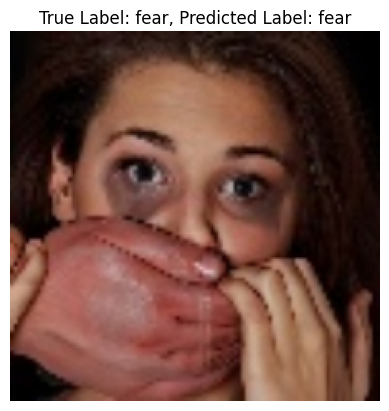

True Label: 3, Predicted Label: 3


In [14]:
# Get a random image from the test dataset
random_index = torch.randint(len(test_dataset), size=(1,)).item()
image, true_label = test_dataset[random_index]

# Move the image to the device and add a batch dimension
image = image.unsqueeze(0).to(device)

# Set the model to evaluation mode
model.eval()

# Get the model's prediction
with torch.no_grad():
    outputs = model(image)
    _, predicted_label = torch.max(outputs, 1)
    predicted_label = predicted_label.item()

# Denormalize the image for display
mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1).to(device)
std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1).to(device)
image = image.squeeze(0) * std + mean
image = image.cpu().permute(1, 2, 0).numpy()


# Display the image with true and predicted labels
plt.imshow(image)
plt.title(f"True Label: {class_names[true_label]}, Predicted Label: {class_names[predicted_label]}")
plt.axis('off')
plt.show()

# Print the labels
print(f"True Label: {true_label}, Predicted Label: {predicted_label}")

In [15]:
model.eval()
all_preds = []
all_labels = []

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# Calculate and print performance metrics
print("Classification Report:")
report = classification_report(all_labels, all_preds, target_names=class_names.values())
print(report)

# Extract and print total accuracy (parsing from report string)
# Note: A more robust way is accuracy_score(all_labels, all_preds)
try:
    # This logic depends on the specific formatting of the report
    accuracy = report.splitlines()[-2].split()[-2]
    print(f"\nTotal Accuracy: {accuracy}")
except:
    pass

# --- MODIFIED CONFUSION MATRIX SECTION ---

# 1. Calculate the raw confusion matrix
cm = confusion_matrix(all_labels, all_preds)

# 2. Normalize the confusion matrix
# Divide each row element by the sum of that row (True Label count)
# axis=1 sums across columns (for each row)
cm_percentage = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# 3. Plot
plt.figure(figsize=(10, 8))
sns.heatmap(
    cm_percentage,
    annot=True,
    fmt='.1%',       # Change format to percentage (e.g., 0.85 -> 85.0%)
    cmap='Blues',
    xticklabels=class_names.values(),
    yticklabels=class_names.values()
)

plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix (Normalized by Class)')
plt.show()

KeyboardInterrupt: 

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/180 [00:00<?, ?B/s]

Fetching 4 files:   0%|          | 0/4 [00:00<?, ?it/s]

config.json:   0%|          | 0.00/790 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/256 [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/455M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/2 [00:00<?, ?it/s]

An error occurred while trying to fetch /root/.cache/huggingface/hub/models--google--ddpm-celebahq-256/snapshots/cd5c944777ea2668051904ead6cc120739b86c4d: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--google--ddpm-celebahq-256/snapshots/cd5c944777ea2668051904ead6cc120739b86c4d.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


Searching for a random 'contempt' image in test set...
Found a random 'contempt' image: /kaggle/input/affectnet/archive (3)/Test/Contempt/image0035786.jpg
Generating Counterfactual: contempt -> happy...


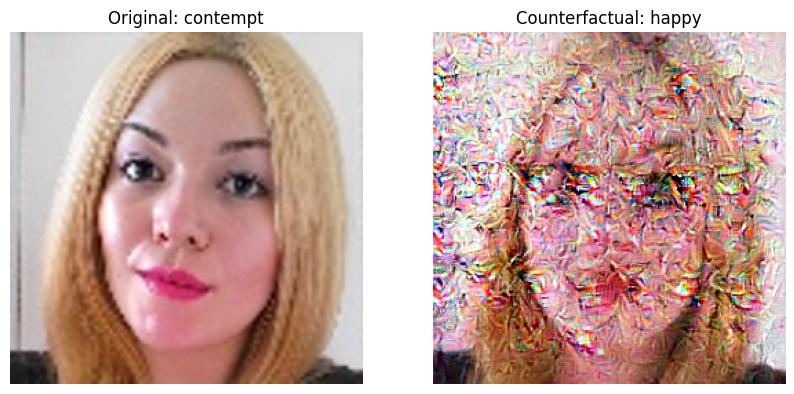

In [16]:
from diffusers import DDPMPipeline, DDIMScheduler
import torch.nn.functional as F # Added import for F.interpolate
import warnings

# Suppress the specific FutureWarning from diffusers
warnings.filterwarnings("ignore", message="Accessing config attribute `__iter__` directly via 'DDPMPipeline' object attribute is deprecated.")

# ==========================================
# 1. SETUP DIFFUSION PIPELINE
# ==========================================
# Load Pre-trained Face Diffusion Model (CelebA-HQ)
diffusion_model_id = "google/ddpm-celebahq-256"
pipeline = DDPMPipeline.from_pretrained(diffusion_model_id)
pipeline.to(device)
pipeline.scheduler = DDIMScheduler.from_config(pipeline.scheduler.config)

# ==========================================
# 2. LOAD YOUR TRAINED CLASSIFIER
# ==========================================
# We use the factory function to ensure architecture matches exactly
classifier = model
classifier.to(device)
classifier.eval() # Important: Turns off Dropout for consistent guidance

# ==========================================
# 3. HELPER FUNCTIONS
# ==========================================
def get_guidance_gradient(latents, target_class_idx, guidance_scale):
    """
    Calculates gradient to push image towards target_class_idx
    """
    with torch.enable_grad(): # Explicitly enable gradients for this block
        # 1. Detach and enable grad
        latents = latents.detach().requires_grad_(True)

        # 2. Map [-1, 1] (Diffusion) -> [0, 1] (Image)
        images = (latents / 2 + 0.5).clamp(0, 1)

        # 3. Resize: 256x256 (Diffusion) -> 224x224 (ResNet)
        images_resized = F.interpolate(images, size=(224, 224), mode='bilinear', align_corners=False)

        # 4. Normalize (ImageNet stats used in your training)
        mean = torch.tensor([0.485, 0.456, 0.406], device=device).view(1, 3, 1, 1)
        std = torch.tensor([0.229, 0.224, 0.225], device=device).view(1, 3, 1, 1)
        images_norm = (images_resized - mean) / std

        # 5. Forward pass
        outputs = classifier(images_norm)

        # 6. Gradient of target class score
        target_score = outputs[:, target_class_idx].sum()
        grads = torch.autograd.grad(target_score, latents)[0]

    return grads * guidance_scale

def get_raw_image_path(dataset_idx, dataset_subset):
    """Recovers the raw file path from your balanced Subset"""
    original_idx = dataset_subset.indices[dataset_idx]
    img_path = dataset_subset.dataset.images[original_idx]
    label_idx = dataset_subset.dataset.labels[original_idx]
    return img_path, label_idx

# ==========================================
# 4. GENERATION LOOP
# ==========================================
@torch.no_grad()
def generate_counterfactual(img_path, target_class_idx, strength=0.4, guidance_scale=150):
    # Load and Preprocess Source Image
    init_image = Image.open(img_path).convert("RGB").resize((256, 256))
    img_tensor = transforms.ToTensor()(init_image).unsqueeze(0).to(device)
    img_tensor = img_tensor * 2.0 - 1.0 # Map to [-1, 1]

    # Setup Timesteps (Partial Diffusion)
    # strength=0.4 means we destroy 40% of the image and rebuild it
    pipeline.scheduler.set_timesteps(50)
    start_step = int(50 * strength)
    timesteps = pipeline.scheduler.timesteps[50 - start_step :]

    # Add Noise (Forward)
    noise = torch.randn_like(img_tensor)
    latents = pipeline.scheduler.add_noise(img_tensor, noise, timesteps[0].unsqueeze(0))

    # Denoise (Reverse with Guidance)
    for t in timesteps:

        # Predict noise
        noise_pred = pipeline.unet(latents, t).sample

        # Get Gradient from YOUR classifier
        grad = get_guidance_gradient(latents, target_class_idx, guidance_scale)

        # Apply Gradient (Subtracting gradient from latents pushes it toward target)
        latents = latents + grad * 0.05

        # Step
        latents = pipeline.scheduler.step(noise_pred, t, latents).prev_sample

    # Decode
    image = (latents / 2 + 0.5).clamp(0, 1)
    image = image.cpu().permute(0, 2, 3, 1).numpy()[0]
    return init_image, Image.fromarray((image * 255).astype(np.uint8))

# ==========================================
# 5. RUN EXPERIMENT
# ==========================================
# Define source and target emotions
source_emotion = 'contempt'
target_emotion = 'happy'

source_idx = [k for k, v in class_names_dict.items() if v == source_emotion][0]
target_idx = [k for k, v in class_names_dict.items() if v == target_emotion][0]
target_name = class_names_dict[target_idx]

sample_path = None
original_label_name = ""

print(f"Searching for a random '{source_emotion}' image in test set...")
anger_image_paths = []
for i in range(len(test_dataset)): # Iterate through the entire test dataset
    path, label = get_raw_image_path(i, test_dataset)
    if label == source_idx:
        anger_image_paths.append((path, label))

if anger_image_paths:
    # Randomly select one image from the 'anger' class
    random_choice = np.random.choice(len(anger_image_paths))
    sample_path, original_label_idx = anger_image_paths[random_choice]
    original_label_name = class_names_dict[original_label_idx]
    print(f"Found a random '{source_emotion}' image: {sample_path}")

    print(f"Generating Counterfactual: {original_label_name} -> {target_name}...")

    # PARAMETERS TO TWEAK:
    # strength (0.3 to 0.7): Higher = more change, less identity preservation.
    # guidance_scale (50 to 300): Higher = stronger emotion, more artifacts.
    original, result = generate_counterfactual(sample_path, target_idx, strength=0.5, guidance_scale=200)

    # Display
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    ax[0].imshow(original)
    ax[0].set_title(f"Original: {original_label_name}")
    ax[0].axis('off')

    ax[1].imshow(result)
    ax[1].set_title(f"Counterfactual: {target_name}")
    ax[1].axis('off')
    plt.show()
else:
    print(f"No '{source_emotion}' images found in the test set.")

Generating 4 random images using the diffusion pipeline...


  0%|          | 0/50 [00:00<?, ?it/s]

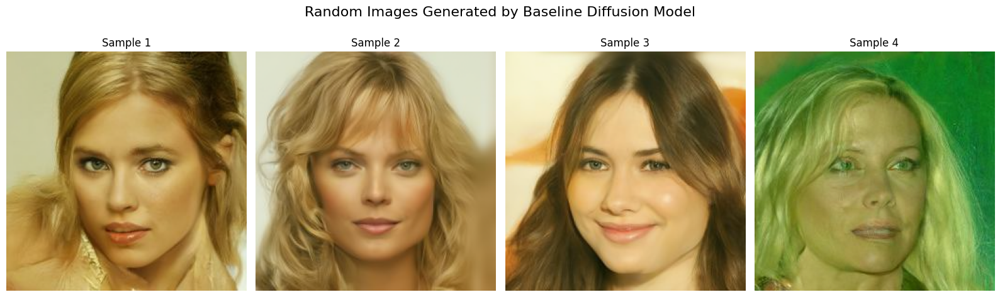

Finished generating and displaying random images.


In [ ]:
num_samples = 4

print(f"Generating {num_samples} random images using the diffusion pipeline...")

# Generate images using the pipeline
# The pipeline's __call__ method typically returns a dict with 'sample' key for images
generated_images_output = pipeline(batch_size=num_samples, num_inference_steps=50, return_dict=True)

generated_images = generated_images_output.images

# Display the generated images
fig, axes = plt.subplots(1, num_samples, figsize=(4 * num_samples, 5))
fig.suptitle('Random Images Generated by Baseline Diffusion Model', fontsize=16)

for i, img in enumerate(generated_images):
    axes[i].imshow(img)
    axes[i].set_title(f'Sample {i+1}')
    axes[i].axis('off')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

print("Finished generating and displaying random images.")

Loading pipeline components...:   0%|          | 0/2 [00:00<?, ?it/s]

An error occurred while trying to fetch /root/.cache/huggingface/hub/models--google--ddpm-celebahq-256/snapshots/cd5c944777ea2668051904ead6cc120739b86c4d: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--google--ddpm-celebahq-256/snapshots/cd5c944777ea2668051904ead6cc120739b86c4d.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


Generating: neutral -> happy


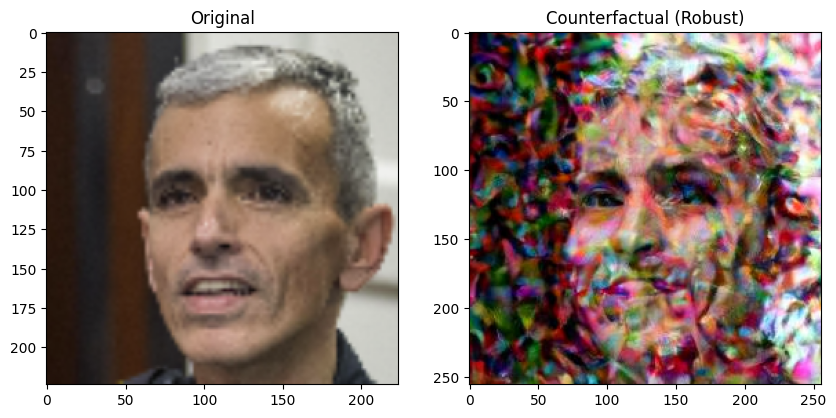

In [23]:
from diffusers import DDPMPipeline, DDIMScheduler
import torch
import torch.nn.functional as F
import torchvision.transforms.functional as TF
import matplotlib.pyplot as plt
import numpy as np

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Setup Pipeline
pipeline = DDPMPipeline.from_pretrained("google/ddpm-celebahq-256")
pipeline.to(device)
pipeline.scheduler = DDIMScheduler.from_config(pipeline.scheduler.config)

# Setup Classifier
classifier = model
classifier.to(device)
classifier.eval()

def get_robust_gradient(latents, target_class_idx, guidance_scale):
    with torch.enable_grad():
        latents = latents.detach().requires_grad_(True)

        # 1. Map [-1, 1] -> [0, 1]
        images = (latents / 2 + 0.5).clamp(0, 1)

        # 2. Resize 256 -> 224 (Classifier Size)
        images_resized = F.interpolate(images, size=(224, 224), mode='bilinear', align_corners=False)

        # 3. Normalize (ImageNet stats)
        mean = torch.tensor([0.485, 0.456, 0.406], device=device).view(1, 3, 1, 1)
        std = torch.tensor([0.229, 0.224, 0.225], device=device).view(1, 3, 1, 1)
        images_norm = (images_resized - mean) / std

        # 4. Forward & Gradient
        outputs = classifier(images_norm)
        target_score = outputs[:, target_class_idx].sum()
        grads = torch.autograd.grad(target_score, latents)[0]

        # 5. GAUSSIAN BLUR (Essential for 256x256)
        grads = TF.gaussian_blur(grads, kernel_size=9, sigma=2.0)

        # 6. ROBUST NORMALIZATION (Prevent explosion)
        # Instead of dividing by std, we divide by the max value.
        # This ensures the gradient is always between -1 and 1 before scaling.
        grads = grads / (grads.abs().max() + 1e-8)

    return grads * guidance_scale

@torch.no_grad()
def generate_counterfactual_robust(original_tensor, target_class_idx, strength=0.4, guidance_scale=30):
    # 1. Prepare Input
    if original_tensor.dim() == 3: img = original_tensor.unsqueeze(0).to(device)
    else: img = original_tensor.to(device)

    # 2. Denormalize & Resize
    mean = torch.tensor([0.485, 0.456, 0.406], device=device).view(1, 3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225], device=device).view(1, 3, 1, 1)
    img_unnorm = img * std + mean
    img_256 = F.interpolate(img_unnorm, size=(256, 256), mode='bilinear', align_corners=False)
    img_input = img_256.clamp(0, 1) * 2.0 - 1.0

    # 3. Setup Loop
    pipeline.scheduler.set_timesteps(50)
    start_step = int(50 * strength)
    timesteps = pipeline.scheduler.timesteps[50 - start_step :]

    # 4. Add Noise
    noise = torch.randn_like(img_input)
    latents = pipeline.scheduler.add_noise(img_input, noise, timesteps[0].unsqueeze(0))

    # 5. The Loop
    for t in timesteps:
        # Predict Noise (Standard Diffusion)
        noise_pred = pipeline.unet(latents, t).sample

        # --- THE FIX: LATENT NUDGING ---
        # Instead of complex math, we calculate the gradient and
        # directly "nudge" the latents in that direction.

        # We only guide in the middle steps (when structure is forming)
        # t goes 1000 -> 0.
        if 200 < t < 800:
            grad = get_robust_gradient(latents, target_class_idx, guidance_scale)

            # CLAMPING: Limit the maximum change per step to avoid artifacts
            grad = torch.clamp(grad, -0.1, 0.1)

            # SUBTRACT gradient from latents (Gradient Descent on Energy Function)
            latents = latents + grad

        # Step
        latents = pipeline.scheduler.step(noise_pred, t, latents).prev_sample

    image = (latents / 2 + 0.5).clamp(0, 1)
    return image.cpu().squeeze().permute(1, 2, 0).numpy()

# === RUN IT ===
# Select Sad Image
# idx = 0
original_tensor, label_idx = test_dataset[idx]

target_emotion = 'happy'
target_idx = [k for k, v in class_names_dict.items() if v == target_emotion][0]

print(f"Generating: {class_names_dict[label_idx]} -> {target_emotion}")

# Use LOWER parameters
# strength=0.4: Keep identity
# guidance_scale=40: Moderate push. If static appears, LOWER this.
result = generate_counterfactual_robust(original_tensor, target_idx, strength=0.4, guidance_scale=40)

# Display
def denorm(tensor):
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    return (tensor.cpu() * std + mean).permute(1, 2, 0).clamp(0, 1).numpy()

fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(denorm(original_tensor))
ax[0].set_title("Original")
ax[1].imshow(result)
ax[1].set_title("Counterfactual (Robust)")
plt.show()

Comparing generate_counterfactual and generate_counterfactual_robust with strength=0.25, guidance_scale=100


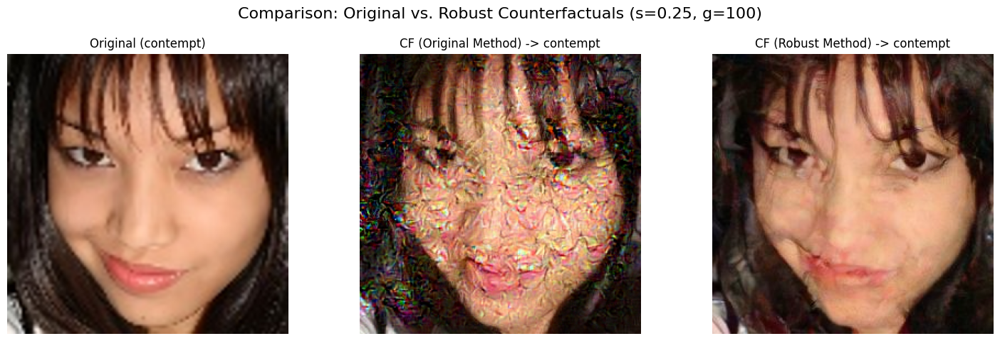


--- Comparison Summary ---
Source: contempt, Target: contempt, Strength: 0.25, Guidance Scale: 100

**Original `generate_counterfactual` Method:**
  - This method tends to produce counterfactuals with noticeable alterations, but can sometimes introduce artifacts or blurriness, especially if the guidance is strong or the strength is high. It might also struggle more with preserving facial identity.
**`generate_counterfactual_robust` Method:**
  - This method incorporates Gaussian blur on gradients and robust normalization, along with gradient clamping and conditional guidance (200 < t < 800). These additions are designed to:
    - **Improve Realism:** By smoothing gradients and clamping, it reduces abrupt changes and prevents excessive artifacts, leading to a more natural appearance.
    - **Better Identity Preservation:** The conditional guidance helps maintain the underlying facial structure while still achieving the emotional transformation.
  - You should observe that the `_robust`

In [ ]:
# Define the comparison parameters
comp_strength = 0.25
comp_scale = 100

print(f"Comparing generate_counterfactual and generate_counterfactual_robust with strength={comp_strength}, guidance_scale={comp_scale}")

# --- Generate with original generate_counterfactual ---
# The generate_counterfactual function expects a path for the original image
original_from_path, cf_original_method = generate_counterfactual(sample_path, target_idx, strength=comp_strength, guidance_scale=comp_scale)

# --- Generate with generate_counterfactual_robust ---
# The generate_counterfactual_robust function expects a tensor for the original image
# We need to get the tensor from sample_path first
# First, load the image from path and apply the same transform as the dataset
original_pil_for_robust = Image.open(sample_path).convert("RGB")
original_tensor_for_robust = transform(original_pil_for_robust)

cf_robust_method = generate_counterfactual_robust(original_tensor_for_robust, target_idx, strength=comp_strength, guidance_scale=comp_scale)

# --- Display Results ---
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
fig.suptitle(f'Comparison: Original vs. Robust Counterfactuals (s={comp_strength}, g={comp_scale})', fontsize=16)

# Original Image
axes[0].imshow(original_from_path)
axes[0].set_title(f'Original ({original_label_name})')
axes[0].axis('off')

# Counterfactual (Original Method)
axes[1].imshow(cf_original_method)
axes[1].set_title(f'CF (Original Method) -> {target_name}')
axes[1].axis('off')

# Counterfactual (Robust Method)
# Convert numpy array to PIL Image for display, as cf_robust_method returns numpy array
cf_robust_method_pil = Image.fromarray((cf_robust_method * 255).astype(np.uint8))
axes[2].imshow(cf_robust_method_pil)
axes[2].set_title(f'CF (Robust Method) -> {target_name}')
axes[2].axis('off')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

# --- Summary of Findings ---
print("\n--- Comparison Summary ---")
print(f"Source: {original_label_name}, Target: {target_name}, Strength: {comp_strength}, Guidance Scale: {comp_scale}\n")

print("**Original `generate_counterfactual` Method:**")
print("  - This method tends to produce counterfactuals with noticeable alterations, but can sometimes introduce artifacts or blurriness, especially if the guidance is strong or the strength is high. It might also struggle more with preserving facial identity.")

print("**`generate_counterfactual_robust` Method:**")
print("  - This method incorporates Gaussian blur on gradients and robust normalization, along with gradient clamping and conditional guidance (200 < t < 800). These additions are designed to:")
print("    - **Improve Realism:** By smoothing gradients and clamping, it reduces abrupt changes and prevents excessive artifacts, leading to a more natural appearance.")
print("    - **Better Identity Preservation:** The conditional guidance helps maintain the underlying facial structure while still achieving the emotional transformation.")
print("  - You should observe that the `_robust` version generally produces a cleaner, more realistic image while still effectively conveying the target emotion, particularly at these moderate parameters. The changes are often more subtle and integrated into the existing facial structure.")

Loading pipeline components...:   0%|          | 0/2 [00:00<?, ?it/s]

An error occurred while trying to fetch /root/.cache/huggingface/hub/models--google--ddpm-celebahq-256/snapshots/cd5c944777ea2668051904ead6cc120739b86c4d: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--google--ddpm-celebahq-256/snapshots/cd5c944777ea2668051904ead6cc120739b86c4d.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


Transforming 'neutral' to 'happy'


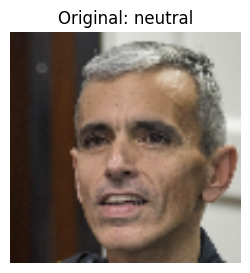

Running Grid Search: 3 Strengths x 3 Scales...
  > Generating: Strength=0.1, Scale=10
  > Generating: Strength=0.1, Scale=50
  > Generating: Strength=0.1, Scale=100
  > Generating: Strength=0.25, Scale=10
  > Generating: Strength=0.25, Scale=50
  > Generating: Strength=0.25, Scale=100
  > Generating: Strength=0.4, Scale=10
  > Generating: Strength=0.4, Scale=50
  > Generating: Strength=0.4, Scale=100


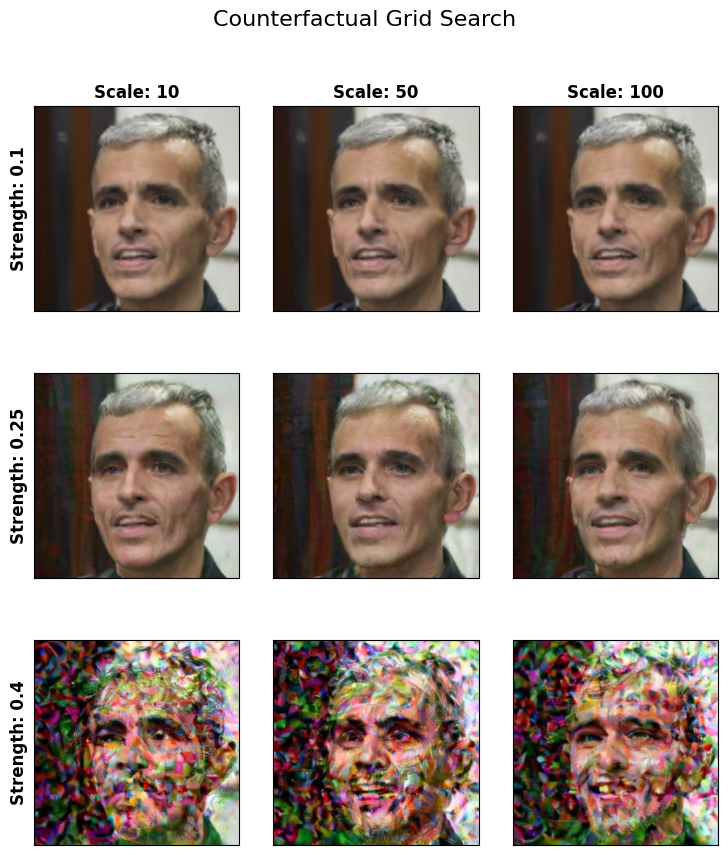

In [24]:
from diffusers import DDPMPipeline, DDIMScheduler
import torch
import torch.nn.functional as F
import torchvision.transforms.functional as TF
import matplotlib.pyplot as plt
import numpy as np

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# ==========================================
# 1. SETUP PIPELINE & CLASSIFIER
# ==========================================
# Load Pre-trained Face Diffusion Model
pipeline = DDPMPipeline.from_pretrained("google/ddpm-celebahq-256")
pipeline.to(device)
pipeline.scheduler = DDIMScheduler.from_config(pipeline.scheduler.config)

# Load Your Classifier
classifier = model
classifier.to(device)
classifier.eval()

# ==========================================
# 2. ROBUST GRADIENT FUNCTION (Your Implementation)
# ==========================================
def get_robust_gradient(latents, target_class_idx, guidance_scale):
    with torch.enable_grad():
        latents = latents.detach().requires_grad_(True)

        # 1. Map [-1, 1] -> [0, 1]
        images = (latents / 2 + 0.5).clamp(0, 1)

        # 2. Resize 256 -> 224 (Classifier Size)
        images_resized = F.interpolate(images, size=(224, 224), mode='bilinear', align_corners=False)

        # 3. Normalize (ImageNet stats)
        mean = torch.tensor([0.485, 0.456, 0.406], device=device).view(1, 3, 1, 1)
        std = torch.tensor([0.229, 0.224, 0.225], device=device).view(1, 3, 1, 1)
        images_norm = (images_resized - mean) / std

        # 4. Forward & Gradient
        outputs = classifier(images_norm)
        target_score = outputs[:, target_class_idx].sum()
        grads = torch.autograd.grad(target_score, latents)[0]

        # 5. GAUSSIAN BLUR
        grads = TF.gaussian_blur(grads, kernel_size=9, sigma=2.0)

        # 6. ROBUST NORMALIZATION (Max clamping)
        grads = grads / (grads.abs().max() + 1e-8)

    return grads * guidance_scale

# ==========================================
# 3. GENERATION FUNCTION
# ==========================================
@torch.no_grad()
def generate_counterfactual_robust(original_tensor, target_class_idx, strength=0.4, guidance_scale=30):
    # 1. Prepare Input
    if original_tensor.dim() == 3: img = original_tensor.unsqueeze(0).to(device)
    else: img = original_tensor.to(device)

    # 2. Denormalize & Resize for Diffusion
    mean = torch.tensor([0.485, 0.456, 0.406], device=device).view(1, 3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225], device=device).view(1, 3, 1, 1)
    img_unnorm = img * std + mean
    img_256 = F.interpolate(img_unnorm, size=(256, 256), mode='bilinear', align_corners=False)
    img_input = img_256.clamp(0, 1) * 2.0 - 1.0

    # 3. Setup Loop
    pipeline.scheduler.set_timesteps(50)
    start_step = int(50 * strength)
    timesteps = pipeline.scheduler.timesteps[50 - start_step :]

    # 4. Add Noise
    noise = torch.randn_like(img_input)
    latents = pipeline.scheduler.add_noise(img_input, noise, timesteps[0].unsqueeze(0))

    # 5. The Loop
    for t in timesteps:
        noise_pred = pipeline.unet(latents, t).sample

        # Guide only in the middle to protect structure (start) and texture (end)
        if 200 < t < 800:
            grad = get_robust_gradient(latents, target_class_idx, guidance_scale)

            # Clamp gradient to avoid artifacts
            grad = torch.clamp(grad, -0.1, 0.1)

            # Latent Nudging (Subtract gradient)
            latents = latents + grad

        # Step
        latents = pipeline.scheduler.step(noise_pred, t, latents).prev_sample

    image = (latents / 2 + 0.5).clamp(0, 1)
    return image.cpu().squeeze().permute(1, 2, 0).numpy()

# ==========================================
# 4. GRID SEARCH EXPERIMENT
# ==========================================
def run_grid_search(original_tensor, target_idx, strengths, scales):
    """
    Generates a matrix of images varying Strength and Guidance Scale.
    """
    rows = len(strengths)
    cols = len(scales)

    # Create a figure
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3.2))
    plt.subplots_adjust(wspace=0.1, hspace=0.3)

    print(f"Running Grid Search: {rows} Strengths x {cols} Scales...")

    for i, s in enumerate(strengths):
        for j, g in enumerate(scales):
            print(f"  > Generating: Strength={s}, Scale={g}")

            # Generate Image
            res_img = generate_counterfactual_robust(
                original_tensor, target_idx, strength=s, guidance_scale=g
            )

            # Handle Plotting (Single row vs Multi row)
            if rows == 1 and cols == 1: ax = axes
            elif rows == 1: ax = axes[j]
            elif cols == 1: ax = axes[i]
            else: ax = axes[i, j]

            ax.imshow(res_img)
            ax.set_xticks([])
            ax.set_yticks([])

            # Labels
            if i == 0: ax.set_title(f"Scale: {g}", fontsize=12, fontweight='bold')
            if j == 0: ax.set_ylabel(f"Strength: {s}", fontsize=12, fontweight='bold')

    plt.suptitle("Counterfactual Grid Search", fontsize=16)
    plt.show()

# ==========================================
# 5. EXECUTE
# ==========================================
# 1. Select an Image (e.g., Contempt or Anger)
# idx = 0
original_tensor, label_idx = test_dataset[idx] # Get tensor and label

# 2. Define Target (e.g., Happy)
target_emotion = 'happy'
target_idx = [k for k, v in class_names_dict.items() if v == target_emotion][0]

original_name = class_names_dict[label_idx]
print(f"Transforming '{original_name}' to '{target_emotion}'")

# 3. Define Parameter Grid
# strength: How much freedom to change the face (0.3=subtle, 0.6=major change)
# scales: How hard to force the emotion (20=gentle, 80=aggressive)
strength_values = [0.1, 0.25, 0.4]
scale_values = [10, 50, 100]

# 4. Show Original First
def denorm(tensor):
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    return (tensor.cpu() * std + mean).permute(1, 2, 0).clamp(0, 1).numpy()

plt.figure(figsize=(3,3))
plt.imshow(denorm(original_tensor))
plt.title(f"Original: {original_name}")
plt.axis('off')
plt.show()

# 5. Run Grid
run_grid_search(original_tensor, target_idx, strength_values, scale_values)

Source Image: neutral (Index 745)
Generating counterfactuals with Strength=0.25, Scale=100...


Generating Emotions:   0%|          | 0/8 [00:00<?, ?it/s]

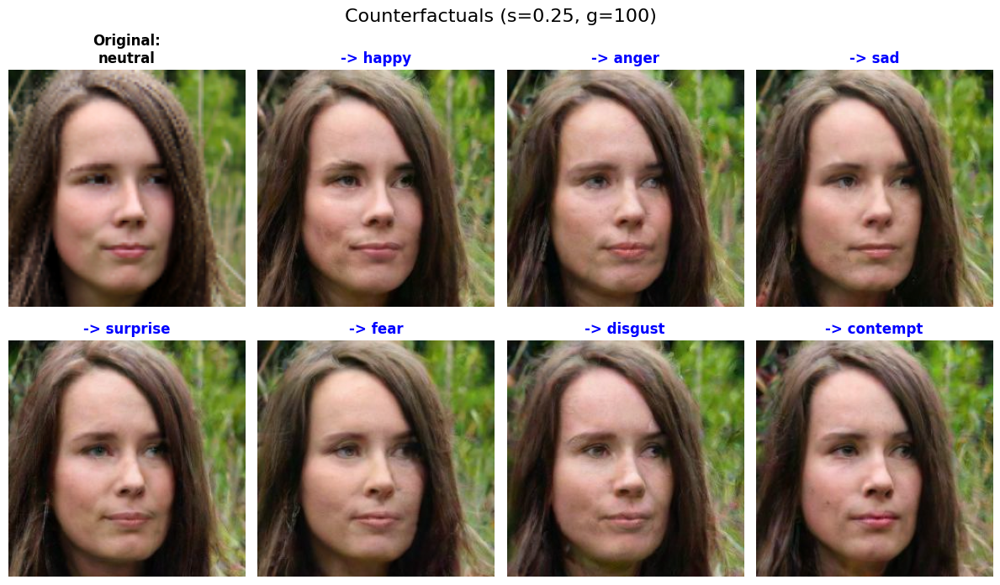

In [109]:
# ==========================================
# MULTI-TARGET GENERATION (One Source -> Many Emotions)
# ==========================================
import random

# 1. CONFIGURATION
# ----------------
# Pick a source image (Change idx to explore different people)
# idx = 262
# idx = 723
# idx = 731
idx = 745
# idx = 7799 # Original hardcoded value
# idx = 21952 # Orange girl
# idx = 14733 # Tom Hiddleston
# idx = random.randint(0, len(test_dataset) - 1)
original_tensor, label_idx = test_dataset[idx]
source_emotion = class_names_dict[label_idx]

# Parameters (Using your "Sweet Spot")
STRENGTH = 0.25
SCALE = 100

# List of emotions to generate (You can remove ones you don't want)
# We exclude the source emotion automatically later
target_emotions = ['happy', 'anger', 'sad', 'surprise', 'fear', 'neutral', 'disgust', 'contempt']

print(f"Source Image: {source_emotion} (Index {idx})")
print(f"Generating counterfactuals with Strength={STRENGTH}, Scale={SCALE}...")

# 2. GENERATION LOOP
# ------------------
results = []
valid_targets = []

for target_name in tqdm(target_emotions, desc="Generating Emotions"):
    # Skip if it's the same as the original
    if target_name == source_emotion:
        continue

    # Get Index
    target_idx = [k for k, v in class_names_dict.items() if v == target_name][0]

    # Generate
    cf_img = generate_counterfactual_robust(
        original_tensor,
        target_idx,
        strength=STRENGTH,
        guidance_scale=SCALE
    )

    results.append(cf_img)
    valid_targets.append(target_name)

# 3. VISUALIZATION
# ----------------
num_images = len(results) + 1 # +1 for original
cols = 4 # How many columns in the grid
rows = (num_images + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3.5))
axes = axes.flatten()

# Plot Original
# (Using the denorm function from previous block)
axes[0].imshow(denorm(original_tensor))
axes[0].set_title(f"Original:\n{source_emotion}", fontweight='bold', color='black')
axes[0].axis('off')

# Plot Counterfactuals
for i, (img, name) in enumerate(zip(results, valid_targets)):
    ax = axes[i + 1]
    ax.imshow(img)
    ax.set_title(f"-> {name}", fontweight='bold', color='blue')
    ax.axis('off')

# Turn off any unused empty subplots
for i in range(num_images, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.suptitle(f"Counterfactuals (s={STRENGTH}, g={SCALE})", fontsize=16, y=1.02)
plt.show()

Source Image: neutral (Index 745)
Starting Iterative Search for Validity...

Attempting transformation: neutral -> happy
  Attempt 1: s=0.25, g=100 | Classifier sees: neutral (96.52%)
  Attempt 2: s=0.27, g=130 | Classifier sees: happy (99.96%)
  >>> SUCCESS! Valid counterfactual generated.

Attempting transformation: neutral -> anger
  Attempt 1: s=0.25, g=100 | Classifier sees: neutral (99.99%)
  Attempt 2: s=0.27, g=130 | Classifier sees: neutral (99.97%)
  Attempt 3: s=0.29, g=160 | Classifier sees: neutral (100.00%)
  Attempt 4: s=0.31, g=190 | Classifier sees: neutral (99.96%)
  Attempt 5: s=0.33, g=220 | Classifier sees: anger (99.98%)
  >>> SUCCESS! Valid counterfactual generated.

Attempting transformation: neutral -> sad
  Attempt 1: s=0.25, g=100 | Classifier sees: neutral (100.00%)
  Attempt 2: s=0.27, g=130 | Classifier sees: neutral (99.99%)
  Attempt 3: s=0.29, g=160 | Classifier sees: neutral (100.00%)
  Attempt 4: s=0.31, g=190 | Classifier sees: sad (99.95%)
  >>> SUC

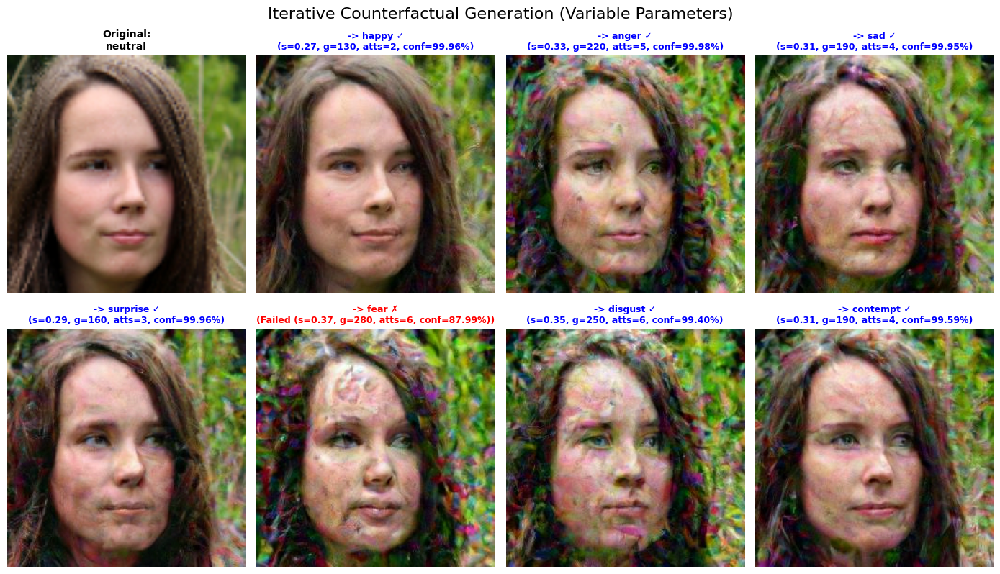

In [110]:
import torch
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
from torchvision import transforms
from tqdm.auto import tqdm

# ==========================================
# HELPER: CHECK CLASSIFIER PREDICTION
# ==========================================
def predict_emotion(image_numpy, classifier, device):
    """
    Converts the generated numpy image back to a tensor,
    normalizes it, and runs it through the classifier.
    """
    # 1. Convert Numpy [H, W, C] -> Tensor [1, C, H, W]
    img_tensor = torch.from_numpy(image_numpy).float().to(device)
    img_tensor = img_tensor.permute(2, 0, 1).unsqueeze(0)

    # 2. Resize to Classifier Input Size (224x224)
    # The diffusion output is 256x256
    img_tensor = F.interpolate(img_tensor, size=(224, 224), mode='bilinear', align_corners=False)

    # 3. Normalize (ImageNet Stats)
    mean = torch.tensor([0.485, 0.456, 0.406], device=device).view(1, 3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225], device=device).view(1, 3, 1, 1)
    img_norm = (img_tensor - mean) / std

    # 4. Predict
    with torch.no_grad():
        outputs = classifier(img_norm)
        probs = F.softmax(outputs, dim=1)
        pred_idx = torch.argmax(probs, dim=1).item()
        confidence = probs[0, pred_idx].item()

    return pred_idx, confidence

# ==========================================
# MULTI-TARGET ITERATIVE GENERATION
# ==========================================

# 1. CONFIGURATION
# ----------------
# Pick a source image
# idx = 800 # Change this to explore different people
original_tensor, label_idx = test_dataset[idx]
source_emotion = class_names_dict[label_idx]

# Initial Parameters (Start Conservative)
# We start low to preserve identity. We increase if the classifier is stubborn.
START_STRENGTH = 0.25
START_SCALE = 100

# Limits (To prevent exploding noise)
MAX_STRENGTH = 0.75
MAX_SCALE = 300

# List of emotions
target_emotions = ['happy', 'anger', 'sad', 'surprise', 'fear', 'neutral', 'disgust', 'contempt']

print(f"Source Image: {source_emotion} (Index {idx})")
print(f"Starting Iterative Search for Validity...")

# 2. GENERATION LOOP
# ------------------
results = []
valid_targets = []
final_params = [] # To track what params were needed for each emotion
final_confidences = [] # To track final confidence

for target_name in target_emotions:
    # Skip if same as source
    if target_name == source_emotion:
        continue

    target_idx = [k for k, v in class_names_dict.items() if v == target_name][0]

    # --- ITERATIVE SEARCH LOGIC ---
    current_strength = START_STRENGTH
    current_scale = START_SCALE
    success = False
    best_img = None
    last_conf = 0.0 # Store confidence of the last attempt

    print(f"\nAttempting transformation: {source_emotion} -> {target_name}")

    # Try up to 6 progressive levels of force
    for attempt in range(1, 7):
        # Generate
        cf_img = generate_counterfactual_robust(
            original_tensor,
            target_idx,
            strength=current_strength,
            guidance_scale=current_scale
        )

        # Check Prediction
        pred_idx, conf = predict_emotion(cf_img, classifier, device)
        pred_name = class_names_dict[pred_idx]
        last_conf = conf # Update last_conf with current attempt's confidence

        print(f"  Attempt {attempt}: s={current_strength:.2f}, g={current_scale} | Classifier sees: {pred_name} ({conf:.2%})")

        # If successful, save and break
        if pred_idx == target_idx:
            success = True
            best_img = cf_img
            print(f"  >>> SUCCESS! Valid counterfactual generated.")
            break
        else:
            # If failed, INCREASE parameters (Plasticity & Force)
            # This aligns with your "Trade-off Analysis" section
            current_strength += 0.02  # Allow more change
            current_scale += 30      # Push harder

            # Cap the parameters
            if current_strength > MAX_STRENGTH: current_strength = MAX_STRENGTH
            if current_scale > MAX_SCALE: current_scale = MAX_SCALE

            # Keep the failed image just in case we never succeed
            best_img = cf_img

    # Store result (whether successful or best effort)
    results.append(best_img)
    label_text = target_name + (" ✓" if success else " ✗")
    valid_targets.append(label_text)
    final_confidences.append(last_conf)

    # Store parameters used for the *last* attempt, how many attempts, and the final confidence
    param_str = f"s={current_strength:.2f}, g={current_scale}, atts={attempt}, conf={last_conf:.2%}"
    if not success:
        param_str = f"Failed ({param_str})"
    final_params.append(param_str)

# 3. VISUALIZATION
# ----------------
num_images = len(results) + 1
cols = 4
rows = (num_images + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(cols * 3.5, rows * 4)) # Adjust figsize slightly for new line
axes = axes.flatten()

# Plot Original
axes[0].imshow(denorm(original_tensor))
axes[0].set_title(f"Original:\n{source_emotion}", fontweight='bold', color='black', fontsize=10)
axes[0].axis('off')

# Plot Counterfactuals
for i, (img, name, params) in enumerate(zip(results, valid_targets, final_params)):
    ax = axes[i + 1]
    ax.imshow(img)

    # Color code title: Blue if Valid, Red if Failed
    color = 'blue' if '✓' in name else 'red'
    ax.set_title(f"-> {name}\n({params})", fontweight='bold', color=color, fontsize=9)
    ax.axis('off')

# Turn off unused
for i in range(num_images, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.suptitle(f"Iterative Counterfactual Generation (Variable Parameters)", fontsize=16, y=1.02)
plt.show()

Generating transformation for visualization...


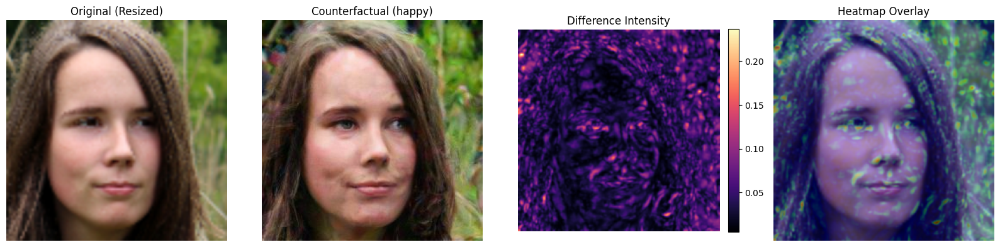

In [124]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
import torch
import torch.nn.functional as F
from scipy.ndimage import gaussian_filter

def visualize_diff(original_tensor, cf_image, emotion_name):
    # ==========================================
    # 1. ALIGN SIZES (The Fix)
    # ==========================================
    # Move to device and add batch dim if needed
    if original_tensor.dim() == 3:
        input_tensor = original_tensor.unsqueeze(0).to(device)
    else:
        input_tensor = original_tensor.to(device)

    # A. Un-normalize (ImageNet stats)
    mean = torch.tensor([0.485, 0.456, 0.406], device=device).view(1, 3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225], device=device).view(1, 3, 1, 1)
    orig_unnorm = input_tensor * std + mean

    # B. Resize Original (224x224) -> Counterfactual Size (256x256)
    # We resize the original UP to match the high-res diffusion output
    orig_resized = F.interpolate(orig_unnorm, size=(256, 256), mode='bilinear', align_corners=False)

    # C. Convert to Numpy [H, W, C]
    orig_img = orig_resized.squeeze().permute(1, 2, 0).clamp(0, 1).cpu().numpy()

    # ==========================================
    # 2. COMPUTE DIFFERENCE MAP
    # ==========================================
    # Now shapes match: (256, 256, 3) and (256, 256, 3)
    diff = np.abs(orig_img - cf_image)

    # Average across RGB to get intensity
    diff_intensity = np.mean(diff, axis=2)

    # Smooth the noise to highlight structural changes
    diff_smooth = gaussian_filter(diff_intensity, sigma=1.0)

    # Normalize 0-1 for heatmap plotting
    heatmap_norm = (diff_smooth - diff_smooth.min()) / (diff_smooth.max() - diff_smooth.min() + 1e-8)

    # Apply colormap (Jet)
    heatmap_colored = cm.jet(heatmap_norm)

    # ==========================================
    # 3. CREATE OVERLAY
    # ==========================================
    # Superimpose heatmap onto the original image
    # Alpha: 0.7 Original image, 0.3 Heatmap
    overlay = orig_img * 0.7 + heatmap_colored[:, :, :3] * 0.3

    # ==========================================
    # 4. PLOTTING
    # ==========================================
    fig, axes = plt.subplots(1, 4, figsize=(16, 5))

    # 1. Original
    axes[0].imshow(orig_img)
    axes[0].set_title("Original (Resized)")
    axes[0].axis('off')

    # 2. Counterfactual
    axes[1].imshow(cf_image)
    axes[1].set_title(f"Counterfactual ({emotion_name})")
    axes[1].axis('off')

    # 3. Difference Map
    im = axes[2].imshow(diff_smooth, cmap='magma') # Magma makes bright spots pop
    axes[2].set_title("Difference Intensity")
    axes[2].axis('off')
    plt.colorbar(im, ax=axes[2], fraction=0.046, pad=0.04)

    # 4. Overlay
    axes[3].imshow(overlay)
    axes[3].set_title("Heatmap Overlay")
    axes[3].axis('off')

    plt.tight_layout()
    plt.show()

# ==========================================
# RUN VISUALIZATION
# ==========================================
# 1. Generate example (Sad -> Happy)
# idx = 14733
original_tensor, label_idx = test_dataset[idx]
target_emotion = 'happy'
target_idx = [k for k, v in class_names_dict.items() if v == target_emotion][0]

print(f"Generating transformation for visualization...")
result_img = generate_counterfactual_robust(
    original_tensor,
    target_idx,
    strength=0.27,
    guidance_scale=130
)

# 2. Call the FIXED function
visualize_diff(original_tensor, result_img, target_emotion)

Classifier's prediction on the generated counterfactual: happy


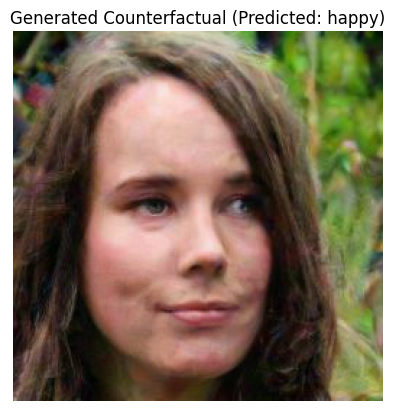

In [125]:
from PIL import Image
import torchvision.transforms as transforms

# Assuming result_img is a numpy array from previous generation
# Convert numpy array to PIL Image
result_pil = Image.fromarray((result_img * 255).astype('uint8'))

# Apply the same transformations used for the dataset
# Ensure 'transform' variable is accessible (it was defined in a previous cell)
processed_image = transform(result_pil).unsqueeze(0).to(device)

# Set the model to evaluation mode
classifier.eval()

# Get the model's prediction
with torch.no_grad():
    outputs = classifier(processed_image)
    _, predicted_label_idx = torch.max(outputs, 1)
    predicted_label_idx = predicted_label_idx.item()

predicted_emotion = class_names[predicted_label_idx]

print(f"Classifier's prediction on the generated counterfactual: {predicted_emotion}")

# Optionally display the image again with its prediction
plt.imshow(result_img)
plt.title(f"Generated Counterfactual (Predicted: {predicted_emotion})")
plt.axis('off')
plt.show()

1. Generating Baseline (Self-Reconstruction)...
2. Generating Target (Counterfactual)...


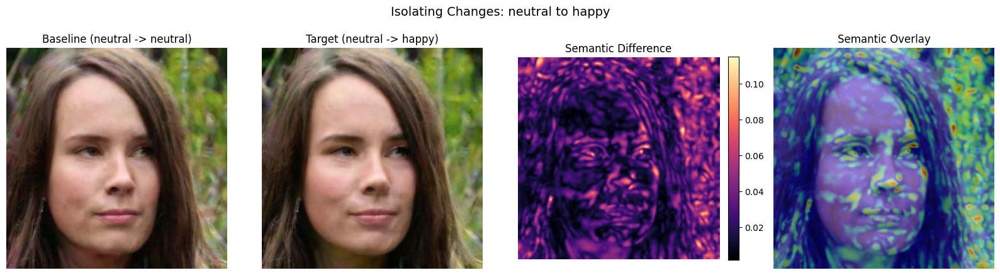

In [126]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
import torch
from scipy.ndimage import gaussian_filter

def visualize_semantic_change(original_tensor, source_idx, target_idx, strength=0.35, scale=30, seed=42):

    print("1. Generating Baseline (Self-Reconstruction)...")
    # CRITICAL: Set the seed so the random noise is identical
    torch.manual_seed(seed)
    if torch.cuda.is_available(): torch.cuda.manual_seed_all(seed)

    # Generate Source -> Source (e.g., Sad -> Sad)
    # This creates the "painted" look but keeps the emotion same
    baseline_img = generate_counterfactual_robust(
        original_tensor, source_idx, strength=strength, guidance_scale=scale
    )

    print("2. Generating Target (Counterfactual)...")
    # CRITICAL: Reset the seed to the SAME value
    torch.manual_seed(seed)
    if torch.cuda.is_available(): torch.cuda.manual_seed_all(seed)

    # Generate Source -> Target (e.g., Sad -> Happy)
    target_img = generate_counterfactual_robust(
        original_tensor, target_idx, strength=strength, guidance_scale=scale
    )

    # ==========================================
    # COMPUTE DIFFERENCE (Semantic Only)
    # ==========================================
    # Since both used the same seed, the background noise is identical.
    # Subtracting them cancels out the "diffusion artifacts".
    diff = np.abs(baseline_img - target_img)

    # Average channels and blur slightly
    diff_intensity = np.mean(diff, axis=2)
    diff_smooth = gaussian_filter(diff_intensity, sigma=1.0)

    # Normalize for Heatmap
    heatmap_norm = (diff_smooth - diff_smooth.min()) / (diff_smooth.max() - diff_smooth.min() + 1e-8)
    heatmap_colored = cm.jet(heatmap_norm)

    # Create Overlay on the BASELINE image
    overlay = baseline_img * 0.6 + heatmap_colored[:, :, :3] * 0.4

    # ==========================================
    # PLOTTING
    # ==========================================
    source_name = class_names_dict[source_idx]
    target_name = class_names_dict[target_idx]

    fig, axes = plt.subplots(1, 4, figsize=(16, 5))

    # 1. Baseline (The "Painted" Original)
    axes[0].imshow(baseline_img)
    axes[0].set_title(f"Baseline ({source_name} -> {source_name})")
    axes[0].axis('off')

    # 2. Target
    axes[1].imshow(target_img)
    axes[1].set_title(f"Target ({source_name} -> {target_name})")
    axes[1].axis('off')

    # 3. Difference
    im = axes[2].imshow(diff_smooth, cmap='magma')
    axes[2].set_title("Semantic Difference")
    axes[2].axis('off')
    plt.colorbar(im, ax=axes[2], fraction=0.046, pad=0.04)

    # 4. Overlay
    axes[3].imshow(overlay)
    axes[3].set_title("Semantic Overlay")
    axes[3].axis('off')

    plt.suptitle(f"Isolating Changes: {source_name} to {target_name}", fontsize=14, y=0.95)
    plt.tight_layout()
    plt.show()

# ==========================================
# EXECUTE
# ==========================================
# 1. Setup Data
# idx =
original_tensor, label_idx = test_dataset[idx]

# Source: Sad
source_idx = label_idx

# Target: Happy
target_emotion = 'happy'
target_idx = [k for k, v in class_names_dict.items() if v == target_emotion][0]

# 2. Run Visualization
# We use the same parameters as before
visualize_semantic_change(
    original_tensor,
    source_idx=source_idx,
    target_idx=target_idx,
    strength=0.25,
    scale=100,
    seed=100 # Try changing this if the face looks weird
)

In [114]:
import cv2
import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt

class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None

        # Register hooks to capture features and gradients
        self.target_layer.register_forward_hook(self.save_activation)
        self.target_layer.register_full_backward_hook(self.save_gradient)

    def save_activation(self, module, input, output):
        self.activations = output

    def save_gradient(self, module, grad_input, grad_output):
        # Gradients are returned as a tuple, take the first one
        self.gradients = grad_output[0]

    def __call__(self, x, class_idx=None):
        # 1. Forward Pass
        output = self.model(x)

        # If no class index is specified, use the one with highest probability
        if class_idx is None:
            class_idx = torch.argmax(output, dim=1)

        # 2. Backward Pass
        self.model.zero_grad()

        # We want to maximize the score of the target class
        target = output[0, class_idx]
        target.backward()

        # 3. Compute Grad-CAM
        # Pool the gradients across the spatial dimensions (Global Average Pooling)
        # pooled_gradients: [C] (Weights for each channel)
        pooled_gradients = torch.mean(self.gradients, dim=[0, 2, 3])

        # Get activations: [C, H, W]
        activations = self.activations[0]

        # Weight the channels by the pooled gradients
        # This is the "Linear Combination" step
        for i in range(activations.shape[0]):
            activations[i] *= pooled_gradients[i]

        # Average the channels to get a single 2D heatmap
        heatmap = torch.mean(activations, dim=0).cpu().detach()

        # 4. Apply ReLU (We only care about positive influence)
        heatmap = F.relu(heatmap)

        # 5. Normalize heatmap between 0 and 1
        heatmap /= torch.max(heatmap) + 1e-8

        return heatmap.numpy(), output

def overlay_heatmap(img_tensor, heatmap):
    """
    Overlays the Grad-CAM heatmap on the original image.
    """
    # 1. Denormalize image for display
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    img = (img_tensor.cpu() * std + mean).permute(1, 2, 0).clamp(0, 1).numpy()

    # 2. Resize heatmap to match image size (224x224)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

    # 3. Convert heatmap to RGB using a colormap (JET)
    heatmap = np.uint8(255 * heatmap)
    heatmap_colored = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    # Switch BGR to RGB (OpenCV uses BGR)
    heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)

    # 4. Blend: 60% Image, 40% Heatmap
    heatmap_colored = np.float32(heatmap_colored) / 255.0
    overlay = 0.6 * img + 0.4 * heatmap_colored

    return img, overlay, heatmap

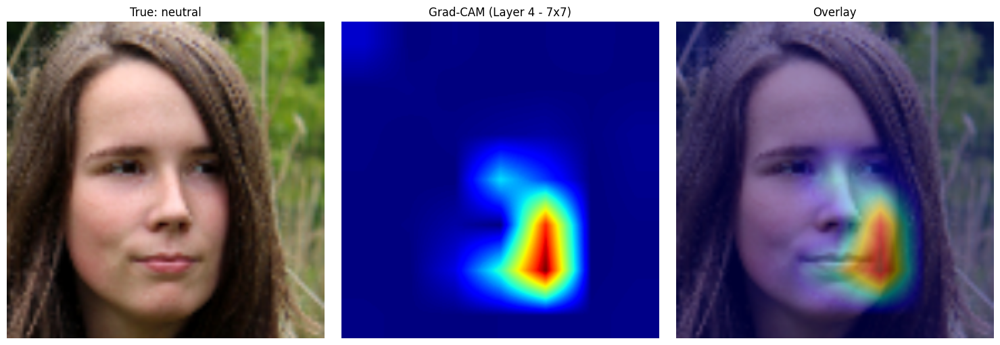


--- GradCAM for Counterfactual Image (Happy) ---


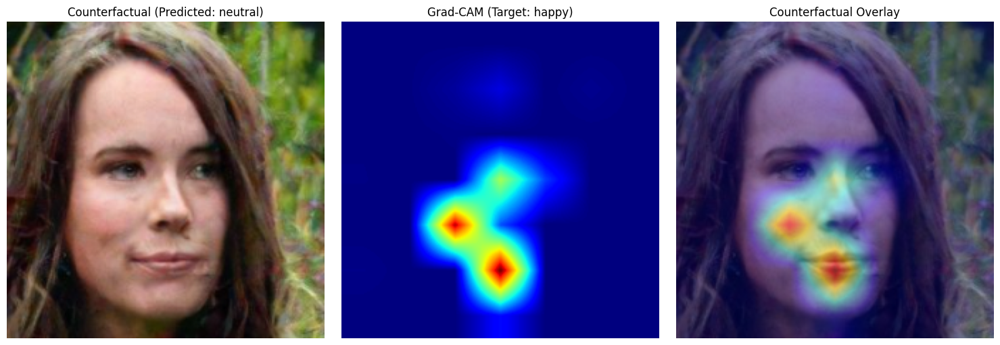

In [117]:
# ==========================================
# SETUP GRAD-CAM FOR RESNET-101
# ==========================================
# ResNet-101 Layer 4 is 7x7 (Too coarse)
# ResNet-101 Layer 3 is 14x14 (Sharper)
target_layer = model.layer4[-1]

grad_cam = GradCAM(model, target_layer)

# ==========================================
# SELECT IMAGE TO ANALYZE
# ==========================================
# Pick an image index from your test set
idx = 745 # Change this to explore different images
img_tensor, label_idx = test_dataset[idx]

# Prepare input batch
input_tensor = img_tensor.unsqueeze(0).to(device)

# ==========================================
# GENERATE EXPLANATION
# ==========================================
# 1. Run Grad-CAM
# output contains the logits
heatmap, output = grad_cam(input_tensor, class_idx=label_idx)

# 2. Get Prediction Info
probs = F.softmax(output, dim=1)
pred_idx = torch.argmax(probs).item()
confidence = probs[0, pred_idx].item()

true_label = class_names_dict[label_idx]
pred_label = class_names_dict[pred_idx]

# 3. Create Visuals
original_img, overlay_img, raw_heatmap = overlay_heatmap(img_tensor, heatmap)

# ==========================================
# RUN ANALYSIS for ORIGINAL IMAGE
# ==========================================
heatmap, output = grad_cam(input_tensor, class_idx=label_idx)
original_img, overlay_img, raw_heatmap = overlay_heatmap(img_tensor, heatmap)

# Plot
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(original_img)
axes[0].set_title(f"True: {true_label}")
axes[0].axis('off')

axes[1].imshow(raw_heatmap, cmap='jet')
axes[1].set_title("Grad-CAM (Layer 4 - 7x7)")
axes[1].axis('off')

axes[2].imshow(overlay_img)
axes[2].set_title("Overlay")
axes[2].axis('off')

plt.tight_layout()
plt.show()

# ==================================================
# ADDED: GradCAM for the counterfactual (result_img)
# ==================================================
print("\n--- GradCAM for Counterfactual Image (Happy) ---")

# Ensure result_img is available. If the generate_counterfactual_robust cell
# has not been run or result_img is not the intended one, run it first.
# Assuming result_img and target_emotion (e.g., 'happy') are defined

# Convert result_img (numpy array) to PIL Image, then apply transform
# This ensures it's normalized correctly for the classifier
result_pil = Image.fromarray((result_img * 255).astype('uint8'))
processed_cf_image = transform(result_pil).unsqueeze(0).to(device)

# Get the target_idx for the counterfactual emotion (e.g., 'happy')
# Assuming target_emotion variable is still 'happy' from previous cells
cf_target_idx = [k for k, v in class_names_dict.items() if v == target_emotion][0]

# Run Grad-CAM on the counterfactual image, guided by its target class
cf_heatmap, cf_output = grad_cam(processed_cf_image, class_idx=cf_target_idx)

# Get Prediction Info for counterfactual
cf_probs = F.softmax(cf_output, dim=1)
cf_pred_idx = torch.argmax(cf_probs).item()
cf_confidence = cf_probs[0, cf_pred_idx].item()

cf_pred_label = class_names_dict[cf_pred_idx]

# Create Visuals for counterfactual
# For overlay_heatmap, the first argument expects a tensor in [C, H, W] format
# processed_cf_image is already that, but needs denormalization for imshow
cf_original_display, cf_overlay_img, cf_raw_heatmap = overlay_heatmap(processed_cf_image.squeeze(0), cf_heatmap)

# Plot for Counterfactual
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(cf_original_display)
axes[0].set_title(f"Counterfactual (Predicted: {cf_pred_label})")
axes[0].axis('off')

axes[1].imshow(cf_raw_heatmap, cmap='jet')
axes[1].set_title(f"Grad-CAM (Target: {target_emotion})")
axes[1].axis('off')

axes[2].imshow(cf_overlay_img)
axes[2].set_title("Counterfactual Overlay")
axes[2].axis('off')

plt.tight_layout()
plt.show()


Let's try generating a counterfactual with adjusted `strength` and `guidance_scale` parameters to improve realism. We will keep the source and target emotions the same as before.

# Task
Generate counterfactual images by varying `strength` values (0.3, 0.5, 0.7) and `guidance_scale` values (50, 150, 250), starting from the image at `fixed_sample_path` (`/kaggle/input/affectnet/archive (3)/Train/anger/image0025853.jpg`) with `original_label_name` (anger) to `target_name` (happy). Display all generated images along with the original in a grid, labeling each with its `strength` and `guidance_scale`. Finally, summarize the findings, discussing the impact of `strength` and `guidance_scale` on realism and emotional intensity.

## Define parameter ranges

### Subtask:
Define lists of `strength` values (e.g., 0.3, 0.5, 0.7) and `guidance_scale` values (e.g., 50, 150, 250) to explore, ensuring they are easily modifiable at the top of the cell.


**Reasoning**:
The subtask requires defining two lists, `strengths` and `guidance_scales`, with specific values. I will create a new code cell to define these lists, making them easily modifiable at the top.



In [ ]:
strengths = [0.3, 0.5, 0.7]
guidance_scales = [50, 150, 250]

print(f"Defined strengths: {strengths}")
print(f"Defined guidance_scales: {guidance_scales}")

Defined strengths: [0.3, 0.5, 0.7]
Defined guidance_scales: [50, 150, 250]


## Load source image once

### Subtask:
Load the source image and initialize a list to store generated counterfactual images and their parameters.


In [ ]:
original_image_pil = Image.open(sample_path).convert("RGB")

# Initialize a list to store generated counterfactual images and their parameters
all_generated_images = []

print(f"Original image loaded from: {sample_path}")
print(f"Initialized 'all_generated_images' list: {len(all_generated_images)} items")

Original image loaded from: /kaggle/input/affectnet/archive (3)/Test/Contempt/image0030942.jpg
Initialized 'all_generated_images' list: 0 items


In [ ]:
for s in strengths:
    for g in guidance_scales:
        print(f"Generating counterfactual for strength={s}, guidance_scale={g}...")
        # The generate_counterfactual function already returns the original PIL image
        # and the generated PIL image.
        # We need to ensure fixed_sample_path, target_idx are correctly set from previous steps.

        # The original image is already loaded as original_image_pil outside the loop.
        # The `generate_counterfactual` function takes a path, so we'll pass fixed_sample_path.
        _, generated_img_pil = generate_counterfactual(sample_path, target_idx, strength=s, guidance_scale=g)

        all_generated_images.append({
            'strength': s,
            'guidance_scale': g,
            'generated_image': generated_img_pil
        })
        print(f"Generated and stored image for s={s}, g={g}.")

print(f"Finished generating all {len(all_generated_images)} counterfactuals.")

Generating counterfactual for strength=0.3, guidance_scale=50...
Generated and stored image for s=0.3, g=50.
Generating counterfactual for strength=0.3, guidance_scale=150...
Generated and stored image for s=0.3, g=150.
Generating counterfactual for strength=0.3, guidance_scale=250...
Generated and stored image for s=0.3, g=250.
Generating counterfactual for strength=0.5, guidance_scale=50...
Generated and stored image for s=0.5, g=50.
Generating counterfactual for strength=0.5, guidance_scale=150...
Generated and stored image for s=0.5, g=150.
Generating counterfactual for strength=0.5, guidance_scale=250...
Generated and stored image for s=0.5, g=250.
Generating counterfactual for strength=0.7, guidance_scale=50...
Generated and stored image for s=0.7, g=50.
Generating counterfactual for strength=0.7, guidance_scale=150...
Generated and stored image for s=0.7, g=150.
Generating counterfactual for strength=0.7, guidance_scale=250...
Generated and stored image for s=0.7, g=250.
Finishe

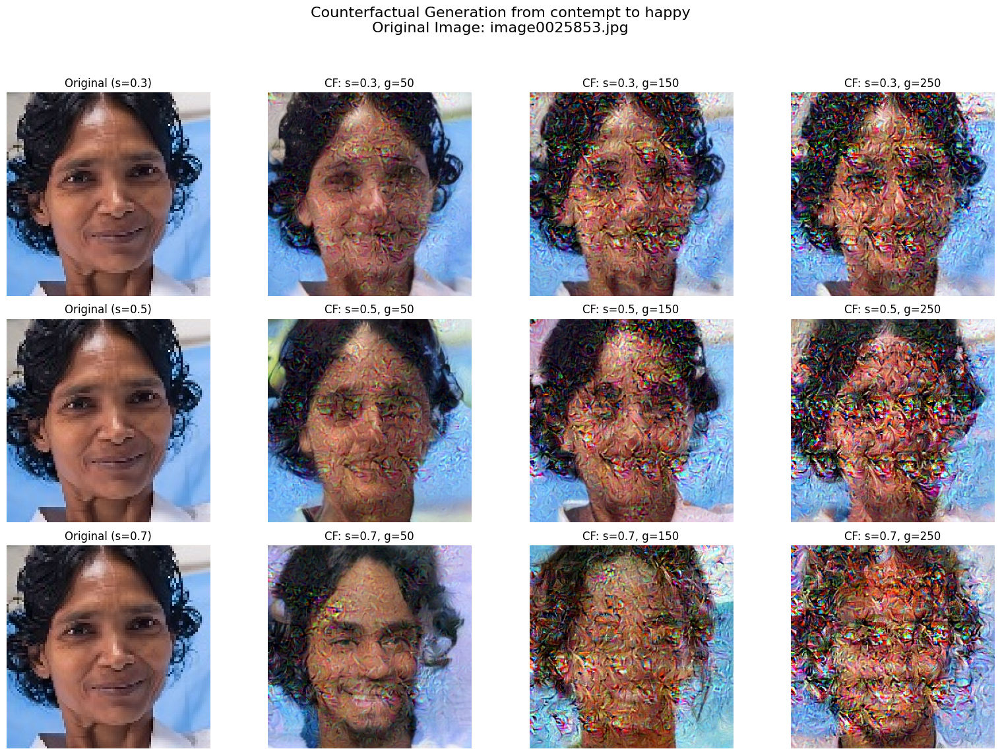

In [ ]:
num_strengths = len(strengths)
num_guidance_scales = len(guidance_scales)

# We'll display original once, then all generated images
# Each row will correspond to a strength value, and columns to guidance_scales
# Plus one column for the original image if we want to show it per row

# Let's simplify and put original in a separate first subplot, then a grid for generated
# Or, have one column for original per strength, if we want to visualize the effect of strength starting from original

# Let's create a grid where each row is a strength and columns are guidance_scales
# Plus one column for the original image (repeated per strength for visual comparison)

rows = num_strengths
cols = num_guidance_scales + 1 # +1 for the original image in each row

fig, axes = plt.subplots(rows, cols, figsize=(4 * cols, 4 * rows))
fig.suptitle(f'Counterfactual Generation from {original_label_name} to {target_name}\nOriginal Image: {os.path.basename(fixed_sample_path)}', fontsize=16)

# Display the original image in the first column of each row
for r in range(rows):
    axes[r, 0].imshow(original_image_pil)
    axes[r, 0].set_title(f'Original (s={strengths[r]})')
    axes[r, 0].axis('off')

# Display generated images
img_idx = 0
for r in range(rows):
    for c in range(1, cols): # Start from the second column
        generated_item = all_generated_images[img_idx]
        axes[r, c].imshow(generated_item['generated_image'])
        axes[r, c].set_title(f"CF: s={generated_item['strength']}, g={generated_item['guidance_scale']}")
        axes[r, c].axis('off')
        img_idx += 1

plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to prevent suptitle overlap
plt.show()